<a href="https://colab.research.google.com/github/odaom/unacast_work_sample/blob/master/Finding_Collective_Mobility_Patterns_Community_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
#@title <-- Press Play to trigger setup { run: "auto", display-mode: "form" }
#@markdown - Autenticates user, initialises BigQuery `client`
#@markdown - Sets default `--project` to `PROJECT_ID` and adds  `--no_df` and `--param` flags to `%%bigquery`
#@markdown - Ask for user  confirmation before executing queries that will cost more than `COST_LIMIT_USD`, unless `--cost_approved` flag is specified

# Authenticate
PROJECT_ID = "uc-shared-demo" #@param {type: "string"}


COST_LIMIT_USD = 1  #@param {type: "number"}

from google.cloud import bigquery
from google.colab import auth

from datetime import datetime

auth.authenticate_user()
client = bigquery.Client(PROJECT_ID)

# Cost estimates



def MB(bytes):
  return float(bytes) / 2**20


def GB(bytes):
  return float(bytes) / 2**30


def TB(bytes):
  return float(bytes) / 2**40


def USD(bytes):
  return (5.00 * TB(max(bytes, 10 * (2 ** 20))))


def estimate_query_bytes(query):
  
  job_config = bigquery.QueryJobConfig()
  job_config.dry_run = True
  query_job = client.query(
      query,
      #location='EU',
      job_config=job_config
  )  # API request
  
  return query_job.total_bytes_processed



# Custom bigquery magics that doesn't make dataframe
from __future__ import print_function

import time
from concurrent import futures

try:
    import IPython
    from IPython import display
    from IPython.core import magic_arguments
except ImportError:  # pragma: NO COVER
    raise ImportError('This module can only be loaded in IPython.')

import google.auth
from google.cloud import bigquery

class Context(object):
    """Storage for objects to be used throughout an IPython notebook session.
    A Context object is initialized when the ``magics`` module is imported,
    and can be found at ``google.cloud.bigquery.magics.context``.
    """
    def __init__(self):
        self._credentials = None
        self._project = None

    @property
    def credentials(self):
        """google.auth.credentials.Credentials: Credentials to use for queries
        performed through IPython magics
        Note:
            These credentials do not need to be explicitly defined if you are
            using Application Default Credentials. If you are not using
            Application Default Credentials, manually construct a
            :class:`google.auth.credentials.Credentials` object and set it as
            the context credentials as demonstrated in the example below. See
            `auth docs`_ for more information on obtaining credentials.
        Example:
            Manually setting the context credentials:
            >>> from google.cloud.bigquery import magics
            >>> from google.oauth2 import service_account
            >>> credentials = (service_account
            ...     .Credentials.from_service_account_file(
            ...         '/path/to/key.json'))
            >>> magics.context.credentials = credentials
        .. _auth docs: http://google-auth.readthedocs.io
            /en/latest/user-guide.html#obtaining-credentials
        """
        if self._credentials is None:
            self._credentials, _ = google.auth.default()
        return self._credentials

    @credentials.setter
    def credentials(self, value):
        self._credentials = value

    @property
    def project(self):
        """str: Default project to use for queries performed through IPython
        magics
        Note:
            The project does not need to be explicitly defined if you have an
            environment default project set. If you do not have a default
            project set in your environment, manually assign the project as
            demonstrated in the example below.
        Example:
            Manually setting the context project:
            >>> from google.cloud.bigquery import magics
            >>> magics.context.project = 'my-project'
        """
        if self._project is None:
            _, self._project = google.auth.default()
        return self._project

    @project.setter
    def project(self, value):
        self._project = value


context = Context()


def _run_query(client, query, job_config=None):
    """Runs a query while printing status updates
    Args:
        client (google.cloud.bigquery.client.Client):
            Client to bundle configuration needed for API requests.
        query (str):
            SQL query to be executed. Defaults to the standard SQL dialect.
            Use the ``job_config`` parameter to change dialects.
        job_config (google.cloud.bigquery.job.QueryJobConfig, optional):
            Extra configuration options for the job.
    Returns:
        google.cloud.bigquery.job.QueryJob: the query job created
    Example:
        >>> client = bigquery.Client()
        >>> _run_query(client, "SELECT 17")
        Executing query with job ID: bf633912-af2c-4780-b568-5d868058632b
        Query executing: 1.66s
        Query complete after 2.07s
        'bf633912-af2c-4780-b568-5d868058632b'
    """
    start_time = time.time()
    query_job = client.query(query, job_config=job_config)
    print('Executing query with job ID: {}'.format(query_job.job_id))

    while True:
        print('\rQuery executing: {:0.2f}s'.format(
            time.time() - start_time), end='')
        try:
            query_job.result(timeout=0.5)
            break
        except futures.TimeoutError:
            continue
    print('\nQuery complete after {:0.2f}s'.format(time.time() - start_time))
    return query_job


@magic_arguments.magic_arguments()
@magic_arguments.argument(
    'destination_var',
    nargs='?',
    help=('If provided, save the output to this variable in addition '
          'to displaying it.'))
@magic_arguments.argument(
    '--project',
    type=str,
    default=PROJECT_ID,
    help=('Project to use for executing this query. Defaults to the context '
          'project.'))
@magic_arguments.argument(
    '--use_legacy_sql',
    action='store_true',
    default=False,
    help=('Sets query to use Legacy SQL instead of Standard SQL. Defaults to '
          'Standard SQL if this argument is not used.'))
@magic_arguments.argument(
    '--no_df',
    action='store_true',
    default=False,
    help=('Sets query to not return result as dataframe'))
@magic_arguments.argument(
    '--cost_approved',
    action='store_true',
    default=False,
    help=('If set, do not prompt user to confirm execution of expensive queries.'))
@magic_arguments.argument(
    '--verbose', 
    action='store_true',
    default=False,
    help=('If set, print verbose output, including the query job ID and the '
          'amount of time for the query to finish. By default, this '
          'information will be displayed as the query runs, but will be '
          'cleared after the query is finished.'))
@magic_arguments.argument(
    '--param',
    type=str,
    default=None,
    help=('String value of optional query parameter @param'))
def _cell_magic(line, query):
    """Underlying function for bigquery cell magic
    Note:
        This function contains the underlying logic for the 'bigquery' cell
        magic. This function is not meant to be called directly.
    Args:
        line (str): "%%bigquery" followed by arguments as required
        query (str): SQL query to run
    Returns:
        pandas.DataFrame: the query results.
    """
    args = magic_arguments.parse_argstring(_cell_magic, line)

    project = args.project or context.project
    client = bigquery.Client(project=project, credentials=context.credentials)
    job_config = bigquery.job.QueryJobConfig()

    query_params = [
        bigquery.ScalarQueryParameter('param', 'STRING', args.param),
    ]
    
    job_config.query_parameters = query_params
    job_config.use_legacy_sql = args.use_legacy_sql
    
    # Check query cost first
    if not args.cost_approved:
      estimate = estimate_query_bytes(query)
      
      if USD(estimate) >= COST_LIMIT_USD:
        confirm = raw_input("Query costs up to ${:.2f}, ok? (y): ".format(USD(estimate)))
        if confirm != "y":
          print("Query aborted")
          return None
      
    query_job = _run_query(client, query, job_config)

    if not args.verbose:
        display.clear_output()

    query_job
    
    if args.no_df:
      print("Query successful. Cost ${:.2f}".format(USD(query_job.total_bytes_processed)))
      return None
    else:
      result = query_job.to_dataframe()
      print("Query successful. Cost ${:.2f}".format(USD(query_job.total_bytes_processed)))
      if args.destination_var:
          IPython.get_ipython().push({args.destination_var: result})
      return result
    
  
ip = get_ipython()

ip.register_magic_function(_cell_magic, magic_kind='cell', magic_name='bigquery')


# Print success message

print("Ran at", datetime.now(), "GMT")

Ran at 2019-08-01 10:33:29.130253 GMT


# Problem Intro: Grouping Areas Together Based On Mobility Patterns

The inspiration for this EDA came from a post at Towards Data Science titled ["How Does the Bay Area Commute?"](https://towardsdatascience.com/how-does-the-bay-area-commute-22f45e00419e) in which the author tries to define natural (i.e. data derived) boundaries for transit service areas in the Bay Area. Commuters in the Bay Area have to interface with several different transit agencies on their daily journeys, because the boundaries of how people travel and how the transit agency areas are arranged don't coindice. The idea is that, given the commute flows between areas, you can map out what areas naturally "belong together", and restructure the transit agency areas so that travelers interface with as few agencies as possible on their daily journeys. 

Through attempting to replicate the method described in the post, I found that the method the author applied was not the most appropriate for the specified goal. Instead of finding clusters based on interconnectedness, the model grouped census tracts based on which tracts had similar commuting patterns. Although the results were okay, we can do better!

**Clustering** is defined as the problem of partitioning objects (data points) into groups based on how similar they are according to some kind of metric (also called a distance function). The metric determines the distance between points in the metric space. A shorter distance between points signifies a greater similarity between them, and thus a greater likelihood of being in the same cluster. 

So the problem of finding which tracts are more related based on flows between them is not best represented as a typical clustering problem. A different approach is needed, one which emphasises the **relationships** between objects instead of the actual representations of the objects in the metric space. 

What we are dealing with – separate areas and the flows between them – can instead be represented as a **network**, more specifically a directed, weighted graph with areas as nodes and flows as weighted edges. Grouping nodes based on their relationships in the network is called **community detection**. In this approach, nodes in the network which are more densely/strongly connected are more likely to be grouped together.

A paper which proved itself incredibly helpful in exploring this approach, and which is well worth a read, was ["An Economic Geography of the United States: From Commutes to Megaregions"](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0166083) by Garrett Dash Nelson and Alasdair Rae. The paper explores "how the places where people live connect with other places from a functional economic point of view", using census tract commute data from the 2006–2010 American Community Survey.

It's possible to use many kinds of interactions between entities to detect potential communities. For Unacast, the entities will typically be geographical areas or places, and the results may shed light on the **collective mobility patterns** of people in the areas in question. Any quantification of travels can be used as an interaction measure, not just journeys to work, so there are many ways to slice our data to reveal interesting relationships between areas. In the words of Nelson & Rae, an analysis like this "is of potential use in a wide variety of fields, including **transit planning, real estate, retail analysis, and infrastructure development**, to name just a few."

Here's a paper using telco location data to explore human mobility patterns: ["The impact of social segregation on human mobility in developing and industrialized regions"](https://epjdatascience.springeropen.com/articles/10.1140/epjds31). And as an aside: With access to telco interaction data, you can use human-to-human interactions like phone calls or text messages to explore relationships between areas, like they did in these papers: ["Redrawing the Map of Great Britain from a Network of Human Interactions"](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0014248), ["Delineating Geographical Regions with Networks of Human Interactions in an Extensive Set of Countries"](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0081707), and ["Spatial Fingerprints of Community Structure in Human Interaction Network for an Extensive Set of Large-Scale Regions"](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0126713).

# In This Notebook
In what follows, we'll try to answer some questions using the community detection approach on Unacast mobility data to illustrate what kind of insights might be gained.

Method-wise, we'll use a community detection approach which optimizes the "**modularity**" of the resulting partitioning scheme. High modularity values occur when the network is subdivided such that there are many/strong links within communities and few between them, as compared to a randomly generated network with otherwise similar characteristics.

There are several modularity optimization algorithms out there, with names such as [Louvain](https://en.wikipedia.org/wiki/Louvain_modularity), [Le Martelot](https://scholar.google.com/scholar?q=Le+Martelot+Hankin+2011&as_sdt=0&lr=&hl=en), [Newman](https://journals.aps.org/pre/abstract/10.1103/PhysRevE.74.036104), [Infomap](https://www.mapequation.org/code.html) and [Combo](http://senseable.mit.edu/community_detection/). As luck would have it, the one which has outcompeted the others in several use cases similar to ours is also implemented in readily available software – namely **Combo**, which is the one we'll use in this notebook. However, this does not preclude experimenting with other algorithms in the future. In particular, Infomap provides really interesting features such as both hard and overlapping communities, first- and second-order dynamics of flows between more than two nodes, and more.

The notebook is organized so that you can read the section takeaways under each section header, and collapse all the "nitty-gritty" parts to get to the juicy maps without having to scroll through lots of code nonsense.

Results for this notebook have been mapped in QGIS. Project files can be found in Team Puzzle > Projects > Community Detection on Drive. 

In [0]:
#@markdown `Python imports`

from google.colab import drive, files
from IPython.core.display import Image # Workaround – couldn't get local images to display with markdown
import matplotlib.pyplot as plt
import numpy as np
from os import path, remove
import pandas as pd
import subprocess

%matplotlib inline

In [0]:
#@markdown `Mount Google Drive`
drive.mount('/gdrive', force_remount=True)
gdrive = '/gdrive/'
data_in_path = gdrive + "Shared drives/Team Puzzle/Projects/Community Detection/data-in/"
data_out_path = gdrive + "Shared drives/Team Puzzle/Projects/Community Detection/data-out/"

Mounted at /gdrive


In [0]:
#@markdown `Define utility functions`

def serialize_area_codes(df):
  """Returns dictionary of area codes as keys and unique serial ids as values."""
  area_codes = np.unique(df.iloc[:, [0, 1]].values.ravel())
  serialized_area_codes = {}
  for serial_id, area_code in enumerate(area_codes):
    serialized_area_codes[area_code] = serial_id
  return serialized_area_codes
  

def write_temporary_vertices(df, serialized_area_codes, tmp_path):
  """Utility function for to_pajek. Writes vertex part of pajek file to temporary file."""
  with open(tmp_path, 'w') as tmp_file:
    tmp_file.write(f'*Vertices {len(serialized_area_codes)}\n')
    for area_code, serial_id in sorted(serialized_area_codes.items(),
                                       key=(lambda item: item[1])):
      tmp_file.write(f'{serial_id} "{area_code}"\n')
    
  
def write_temporary_arcs(df, serialized_area_codes, tmp_path):
  """Utility function for to_pajek. Writes arc part of pajek file to temporary file."""
  origin_serial_ids = df['origin'].apply(serialized_area_codes.get)
  destination_serial_ids = df['destination'].apply(serialized_area_codes.get)
  
  arcs = zip(origin_serial_ids, destination_serial_ids, df["flow"])
  
  with open(tmp_path, 'w') as tmp_file:
    tmp_file.write(f'*Arcs\n')
    for arc in arcs:
      tmp_file.write(f'{arc[0]} {arc[1]} {arc[2]}\n')

      
def to_pajek(df, run_id):
  """Saves a file in Pajek network format for the provided dataframe.
  Origin and destination IDs must be in first and second column, and flows in 
  third column."""
  output_path = f'{run_id}.net'
  tmp_vertices = 'vertices.tmp'
  tmp_arcs = 'arcs.tmp'
  
  serialized_area_codes = serialize_area_codes(df)
  
  write_temporary_vertices(df, serialized_area_codes, tmp_vertices)
  write_temporary_arcs(df, serialized_area_codes, tmp_arcs)
  
  with open(output_path, 'w') as pajek_file:
    pajek_file.write(open(tmp_vertices).read())
    pajek_file.write(open(tmp_arcs).read())
    
  remove(tmp_vertices)
  remove(tmp_arcs)
  
  
def get_community_column(df, run_id, column):
  """Return a column with the community label for each area in the specified
  column of the dataframe. Column should be either the origins or destinations."""
  combo_result_suffix = '_comm_comboC++.txt'
  combo_result_path = f'{run_id}{combo_result_suffix}'

  with open(combo_result_path) as combo_result:
    labels = combo_result.read().strip().split('\n')

  serialized_area_codes = serialize_area_codes(df)
  sorted_serialized_area_codes = sorted(serialized_area_codes.items(), key=(lambda item: item[1]))
  area_codes = [area_code for area_code, serial_id in sorted_serialized_area_codes]
  area_code_assigned_community_dict = dict(zip(area_codes, labels))
  
  result = df[column].apply(area_code_assigned_community_dict.get)
  return result

  
def get_community_count(run_id):
  """Return the number of communities generated by Combo."""
  combo_result_suffix = '_comm_comboC++.txt'
  combo_result_path = f'{run_id}{combo_result_suffix}'
  with open(combo_result_path) as combo_result:
    labels = combo_result.read().strip().split('\n')
    community_count = len(np.unique(labels))
  return community_count
  
  
def install_combo():
  """Installs Combo software if not already done."""
  if not path.isdir('combo'):
    !git clone https://github.com/khwilson/Combo.git combo # Original source is http://senseable.mit.edu/community_detection/combo.zip
    !cd combo/ && make --silent
  
  
def run_combo(run_id, max_communities=50):
  """Wrapper for running Combo. Returns the output to stdout, which is just the modularity score if everything runs as it should."""
  install_combo()
  command = f"combo/comboCPP {run_id}.net {max_communities}"
  process = subprocess.Popen(command.split(), stdout=subprocess.PIPE)
  modularity_score, error_message = process.communicate()
  return modularity_score, error_message
  

# Question 1a: What Do The Bay Area Communities Look Like With Census Data?

Simply to illustrate the quality of the modularity optimization approach, we'll first apply it to the question about the Bay Area commutes from the blog post at Towards Data Science, and compare the results.

In the figures below, notice the near perfect spatial separation of communities. What's remarkable about this is that the algorithm receives absolutely no information about the spatial location of the census tracts, only the commute flows between them. And yet we get fully recognizable, coherent areas as a result. 

Since Combo uses a random number generator in the procedure of finding communities, each run may differ slightly. For larger, more complex networks, the resulting partitioning itself may even differ between runs. If the resulting modularity differs between runs, the partitioning scheme with the highest modularity should be chosen. 

The modularity for a partitioningof 6 communities is about 0.55, which is just okay, not stellar. This means that a lot of tracts also have fairly strong connections to tracts outside their communities, and that any attempt to create sharp boundaries in the Bay Area necessarily intereferes with a lot of flows. 

In [0]:
#@markdown **Fill in what output files from this section should be identified with**
section_id = "bay_area_census" #@param {type:"string"}


## The Nitty-Gritty

### Prep Data

In [0]:
#@markdown `Query: Create df_tracts (California census tract IDs with geospatial attributes)`
%%capture
%%bigquery df_tracts 
SELECT 
  geo_id AS area_code,
  ST_X(internal_point_geo) AS lon,
  ST_Y(internal_point_geo) AS lat,
  internal_point_geo AS point,
  tract_geom AS geom
FROM `bigquery-public-data.geo_census_tracts.census_tracts_california`

In [0]:
#@markdown `Create df_commutes for Bay Area`

# Get US commute data (derived from American Community Survey)
# Data source: https://www.kaggle.com/figshare/united-states-commutes
# Original data source:  https://www.fhwa.dot.gov/planning/census_issues/ctpp/data_products/2006-2010_tract_flows/
dtype = {"OFIPS": "str", "DFIPS": "str"}
df_prep = pd.read_csv(data_in_path + "commute_data.csv", dtype=dtype)
columns = {"OFIPS": "origin", "DFIPS": "destination", "FLOW": "flow"}
df_prep = df_prep.loc[:, columns.keys()].rename(columns, axis=1)

# Merge in geospatial attributes
df_prep = pd.merge(left=df_prep, right=df_tracts, left_on="origin", right_on="area_code")
df_prep = pd.merge(left=df_prep, right=df_tracts, left_on="destination", right_on="area_code", suffixes=["_origin", "_destination"])
df_prep = df_prep.drop(["area_code_origin", "area_code_destination"], axis=1)

# Filter out self-loops
df_prep = df_prep[df_prep["origin"] != df_prep["destination"]]

# Limit dataset to Bay Area
lat_min = 37.0
lat_max = 38.5   
lon_min = -123.0   
lon_max = -121.5 

df_commutes = df_prep[(df_prep['lat_origin'] < lat_max) & (df_prep['lat_origin'] > lat_min)]
df_commutes = df_commutes[(df_commutes['lon_origin'] < lon_max) & (df_commutes['lon_origin'] > lon_min)]
df_commutes = df_commutes[(df_commutes['lat_destination'] < lat_max) & (df_commutes['lat_destination'] > lat_min)]
df_commutes = df_commutes[(df_commutes['lon_destination'] < lon_max) & (df_commutes['lon_destination'] > lon_min)]

df_commutes = df_commutes.reset_index(drop=True)

print(f"Shape: {df_commutes.shape}")
print(f"Number of areas: {len(serialize_area_codes(df_commutes))}")

Shape: (106552, 11)
Number of areas: 1575


### Partition With Combo

Number of communities: 2, maximum possible: 2, modularity score: 0.374673
Number of communities: 3, maximum possible: 3, modularity score: 0.498539
Number of communities: 4, maximum possible: 4, modularity score: 0.539295
Number of communities: 5, maximum possible: 5, modularity score: 0.544119
Number of communities: 6, maximum possible: 6, modularity score: 0.548666
Number of communities: 6, maximum possible: 7, modularity score: 0.548666
Number of communities: 6, maximum possible: 8, modularity score: 0.550433
Plateau reached, exiting.


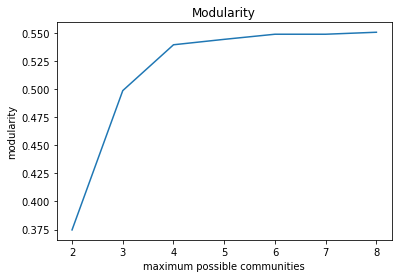

In [0]:
#@markdown **Optional:** `Inspect modularity score for increasing numbers of maximum possible communities as input to Combo`
#%%script false # Uncomment to deactivate cell

run_id = 'inspection'
to_pajek(df_commutes, run_id)
modularity_scores = []
community_counts = []
for max_communities in range(2, 50):
  modularity_score, error_message = run_combo(run_id, max_communities)
  modularity_score = modularity_score.strip()
  try:
    modularity_score = float(modularity_score) 
  except Exception:
    modularity_score = np.nan
  modularity_scores.append(modularity_score)
  community_counts.append(get_community_count(run_id))
  print(f'Number of communities: {get_community_count(run_id)}, maximum possible: {max_communities}, modularity score: {modularity_score}')
  
  if len(community_counts) > 3 and community_counts[-1] == community_counts[-2] == community_counts[-3]:
    print("Plateau reached, exiting.")
    break

remove(f'{run_id}.net')
remove(f'{run_id}_comm_comboC++.txt')


fig, ax = plt.subplots()
ax.plot(list(range(2, 2+len(modularity_scores))), modularity_scores)
ax.set(xlabel='maximum possible communities', ylabel='modularity',
       title='Modularity');

In [0]:
#@markdown `Run Combo`
to_pajek(df_commutes, section_id)
modularity_score, error_message = run_combo(section_id)
print(f'Number of communities generated: {get_community_count(section_id)}, modularity score: {float(modularity_score.strip())}')

Number of communities generated: 6, modularity score: 0.550433


In [0]:
#@markdown `Temporarily save results`

# Create area result dataframe
columns = ["area_code", "point", "geom"]
origins = df_commutes.loc[:, ["origin", "point_origin", "geom_origin"]].drop_duplicates()
destinations = df_commutes.loc[:, ["destination", "point_destination", "geom_destination"]].drop_duplicates()
origins.columns = columns
destinations.columns = columns
df_areas_assigned = pd.concat([origins, destinations], axis=0).drop_duplicates()
df_areas_assigned['community'] = get_community_column(df_areas_assigned, section_id, column='area_code')

# Create flow result dataframe
df_flows_assigned = df_commutes.loc[:, ["origin", "destination", "flow", "point_origin", "point_destination"]].copy()
df_flows_assigned['o_community'] = get_community_column(df_flows_assigned, section_id, column='destination')
df_flows_assigned['d_community'] = get_community_column(df_flows_assigned, section_id, column='origin')


# Save results in csv format (for visualization in QGIS)
areas_result_filename = f"{section_id}_areas_with_assigned_communities.csv"
flows_result_filename = f"{section_id}_flows_with_assigned_communities.csv"

df_areas_assigned.to_csv(areas_result_filename)
df_flows_assigned.to_csv(flows_result_filename)


In [0]:
#@markdown `Download results`
files.download(areas_result_filename)
files.download(flows_result_filename)

## Visualize Results

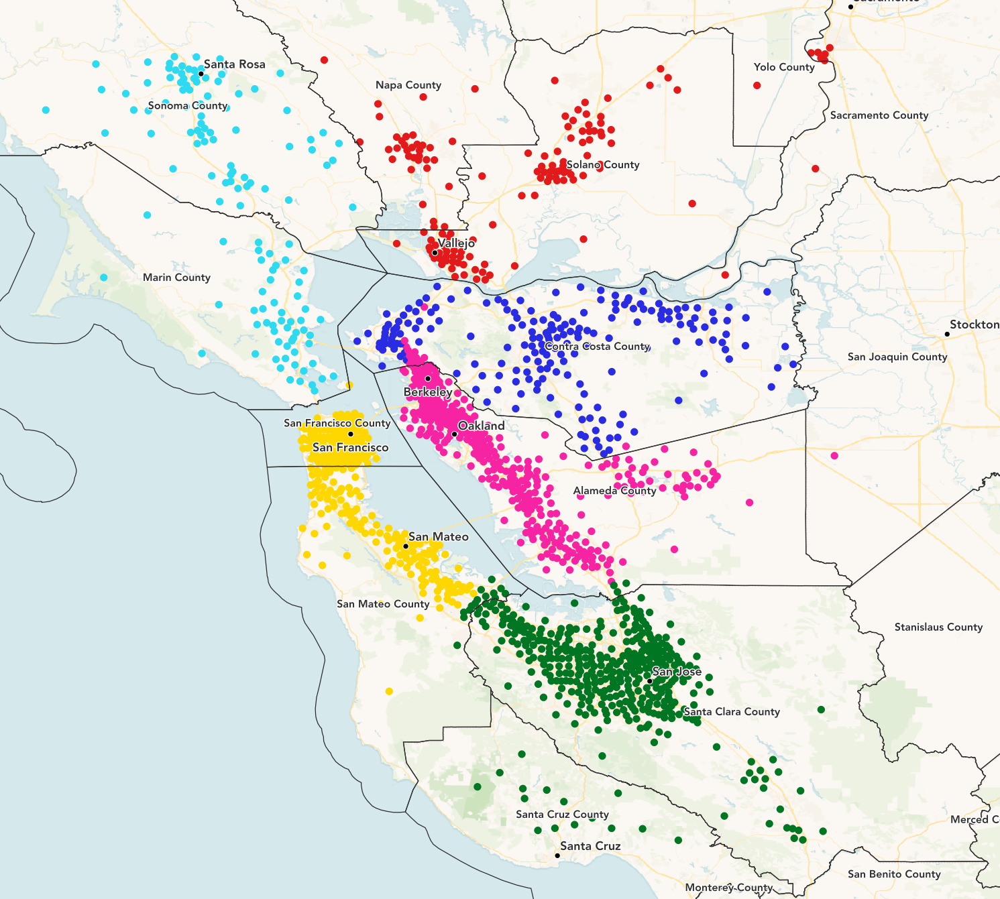

In [0]:
#@title Bay Area Clustering Results, Census Data, Tract Centroids
Image(filename=f'{data_out_path}bay_area_census_points.png', width=1000)

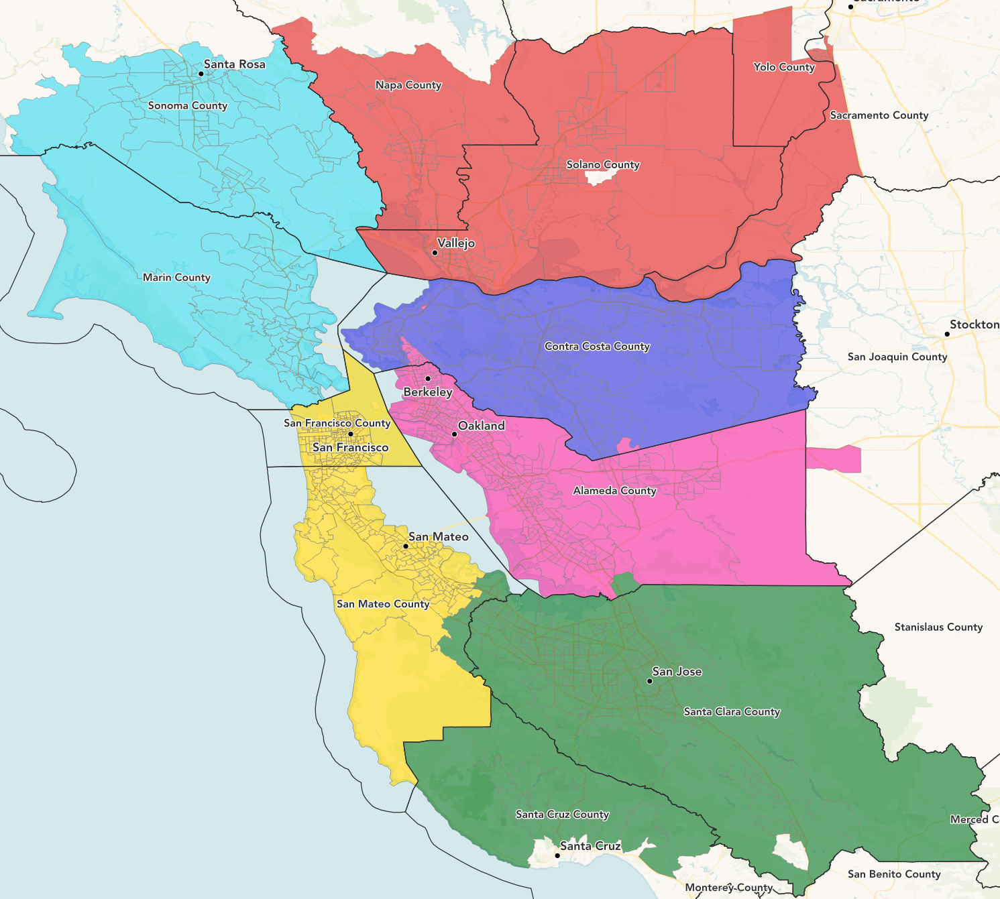

In [0]:
#@title Bay Area Clustering Results, Census Data, Tract Boundaries
Image(filename=f'{data_out_path}bay_area_census_polygons.png', width=1000)

# Question 1b: What Do The Bay Area Communities Look Like With Unacast Data?

Now to the exciting part: Can a cheap query on our GPS data for the Bay Area compete with the US census Goliath? I extracted just a single week of data (last in March 2019), and aggregated the individual home–work pairs that were present. Most of the flows between tracts are only at two or three people (devices), whereas the census commute flows between tracts are typically an order of magnitude higher.

And yet, the results are great and are fully comparable to the census results! In fact, the modularity is at around 0.70, much higher than the census partition. Considering the low flow volumes, this is quite impressive. Instead of spending 5 years to gather data, we can get actionable insights from next to nothing.

In [0]:
#@markdown **Fill in what output files from this section should be identified with**
section_id = "bay_area_unacast" #@param {type:"string"}

## The Nitty-Gritty

### Data Prep

In [0]:
#@markdown `Query (inert): Stage one week of data (end of March 2019)`
%%script false 
%%bigquery
CREATE TABLE `uc-prox-core-dev.z_oda_retained.hw_US_processed_2019_04_01` AS 

SELECT  
  identifier,
  hwId,
  centroidlat,
  centroidlon,
  score,
  classification,
  minBumpTimestampCluster,
  maxBumpTimestampCluster,
  fipscode
FROM 
  `uc-prox-home-work-prod.home_and_work_out.hw_US` 
WHERE 
  processingDate = "2019-04-01"
  AND classification IN ("HOME", "WORK")

In [0]:
#@markdown `Query (inert): Create California subset`
%%script false 
%%bigquery
CREATE TABLE `uc-prox-core-dev.z_oda_retained.hw_US_CA_processed_2019_04_01` AS 

SELECT
  identifier,
  centroidlat,
  centroidlon,
  score,
  classification,
  fipscode
FROM 
  `uc-prox-core-dev.z_oda_retained.hw_US_processed_2019_04_01` a,
  UNNEST(fipscode) AS fipscode
WHERE
  ARRAY_LENGTH(a.fipscode) <= 1
  AND STARTS_WITH(fipscode, "06") -- California

In [0]:
#@markdown `Query: Aggregate individual flows to tract level and create df_prep`
%%capture
%%bigquery df_prep
WITH staged_data AS (
  SELECT
    *
  FROM
    `uc-prox-core-dev.z_oda_retained.hw_US_CA_processed_2019_04_01`
),

id_counts AS (
  SELECT
    identifier,
    COUNT(0) AS count_id
  FROM
    staged_data
  GROUP BY
    identifier
  ORDER BY
    count_id DESC
),

-- Retain only the identifiers for which we have both home and work location assigned
filtered AS (
  SELECT
    *
  FROM 
    staged_data
  JOIN 
    id_counts USING(identifier) WHERE id_counts.count_id >= 2
),

homes AS (
  SELECT
    identifier,
    classification,
    fipscode
  FROM
    filtered
  WHERE
    classification = "HOME"
),

works AS (
  SELECT
    identifier,
    classification,
    fipscode
  FROM
    filtered
  WHERE
    classification = "WORK"
),

-- The origin and destination fips pairs are concatenated in order to aggregate 
individual_flows AS (
  SELECT
    identifier,
    CONCAT(SUBSTR(h.fipscode, 1, 11), SUBSTR(w.fipscode, 1, 11)) AS fips_pair_hw
  FROM
    homes h
  JOIN
    works w USING(identifier)
),

aggregated_flows_concatenated AS (
  SELECT
    fips_pair_hw,
    COUNT(0) AS flow
  FROM
    individual_flows
  GROUP BY
    fips_pair_hw
),

aggregated_flows AS (
SELECT
  SUBSTR(fips_pair_hw, 1, 11) AS fips_home,
  SUBSTR(fips_pair_hw, 12, 11) AS fips_work,
  flow
FROM
  aggregated_flows_concatenated
)

SELECT
  a.fips_home AS origin,
  a.fips_work AS destination,
  a.flow  
FROM
  aggregated_flows a
ORDER BY
  flow DESC

In [0]:
#@markdown `Create df_commutes for Bay Area`

# Merge in geospatial attributes
df_prep = pd.merge(left=df_prep, right=df_tracts, left_on="origin", right_on="area_code")
df_prep = pd.merge(left=df_prep, right=df_tracts, left_on="destination", right_on="area_code", suffixes=["_origin", "_destination"])
df_prep = df_prep.drop(["area_code_origin", "area_code_destination"], axis=1)

# Filter out self-loops
df_prep = df_prep[df_prep["origin"] != df_prep["destination"]]

# Limit dataset to Bay Area
lat_min = 37    
lat_max = 38.5  
lon_min = -123  
lon_max = -121.5

df_commutes = df_prep[(df_prep['lat_origin'] < lat_max) & (df_prep['lat_origin'] > lat_min)]
df_commutes = df_commutes[(df_commutes['lon_origin'] < lon_max) & (df_commutes['lon_origin'] > lon_min)]
df_commutes = df_commutes[(df_commutes['lat_destination'] < lat_max) & (df_commutes['lat_destination'] > lat_min)]
df_commutes = df_commutes[(df_commutes['lon_destination'] < lon_max) & (df_commutes['lon_destination'] > lon_min)]

df_commutes = df_commutes.reset_index(drop=True)

print(f"Shape: {df_commutes.shape}")
print(f"Number of areas: {len(serialize_area_codes(df_commutes))}")

Shape: (189399, 11)
Number of areas: 1581


### Partition With Combo

Number of communities: 2, maximum possible: 2, modularity score: 0.386496
Number of communities: 3, maximum possible: 3, modularity score: 0.510965
Number of communities: 4, maximum possible: 4, modularity score: 0.557889
Number of communities: 5, maximum possible: 5, modularity score: 0.582108
Number of communities: 6, maximum possible: 6, modularity score: 0.584601
Number of communities: 7, maximum possible: 7, modularity score: 0.589157
Number of communities: 8, maximum possible: 8, modularity score: 0.59249
Number of communities: 8, maximum possible: 9, modularity score: 0.59249
Number of communities: 8, maximum possible: 10, modularity score: 0.59249
Plateau reached, exiting.


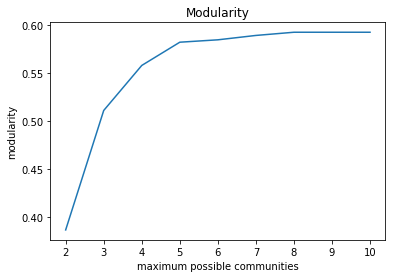

In [0]:
#@markdown **Optional:** `Inspect modularity score for increasing numbers of maximum possible communities as input to Combo`
#%%script false # Uncomment to deactivate cell

run_id = 'inspection'
to_pajek(df_commutes, run_id)
modularity_scores = []
community_counts = []
for max_communities in range(2, 50):
  modularity_score, error_message = run_combo(run_id, max_communities)
  modularity_score = modularity_score.strip()
  try:
    modularity_score = float(modularity_score) 
  except Exception:
    modularity_score = np.nan
  modularity_scores.append(modularity_score)
  community_counts.append(get_community_count(run_id))
  print(f'Number of communities: {get_community_count(run_id)}, maximum possible: {max_communities}, modularity score: {modularity_score}')
  
  if len(community_counts) > 3 and community_counts[-1] == community_counts[-2] == community_counts[-3]:
    print("Plateau reached, exiting.")
    break

remove(f'{run_id}.net')
remove(f'{run_id}_comm_comboC++.txt')


fig, ax = plt.subplots()
ax.plot(list(range(2, 2+len(modularity_scores))), modularity_scores)
ax.set(xlabel='maximum possible communities', ylabel='modularity',
       title='Modularity');

In [0]:
#@markdown `Run Combo`
to_pajek(df_commutes, section_id)
modularity_score, error_message = run_combo(section_id)
print(f'Number of communities generated: {get_community_count(section_id)}, modularity score: {float(modularity_score.strip())}')

Number of communities generated: 8, modularity score: 0.59249


In [0]:
#@markdown `Temporarily save results`

# Create area result dataframe
columns = ["area_code", "point", "geom"]
origins = df_commutes.loc[:, ["origin", "point_origin", "geom_origin"]].drop_duplicates()
destinations = df_commutes.loc[:, ["destination", "point_destination", "geom_destination"]].drop_duplicates()
origins.columns = columns
destinations.columns = columns
df_areas_assigned = pd.concat([origins, destinations], axis=0).drop_duplicates()
df_areas_assigned['community'] = get_community_column(df_areas_assigned, section_id, column='area_code')

# Create flow result dataframe
df_flows_assigned = df_commutes.loc[:, ["origin", "destination", "flow", "point_origin", "point_destination"]].copy()
df_flows_assigned['o_community'] = get_community_column(df_flows_assigned, section_id, column='destination')
df_flows_assigned['d_community'] = get_community_column(df_flows_assigned, section_id, column='origin')


# Save results in csv format (for visualization in QGIS)
areas_result_filename = f"{section_id}_areas_with_assigned_communities.csv"
flows_result_filename = f"{section_id}_flows_with_assigned_communities.csv"

df_areas_assigned.to_csv(areas_result_filename)
df_flows_assigned.to_csv(flows_result_filename)

In [0]:
#@markdown `Download results`
files.download(areas_result_filename)
files.download(flows_result_filename)

## Visualize Results

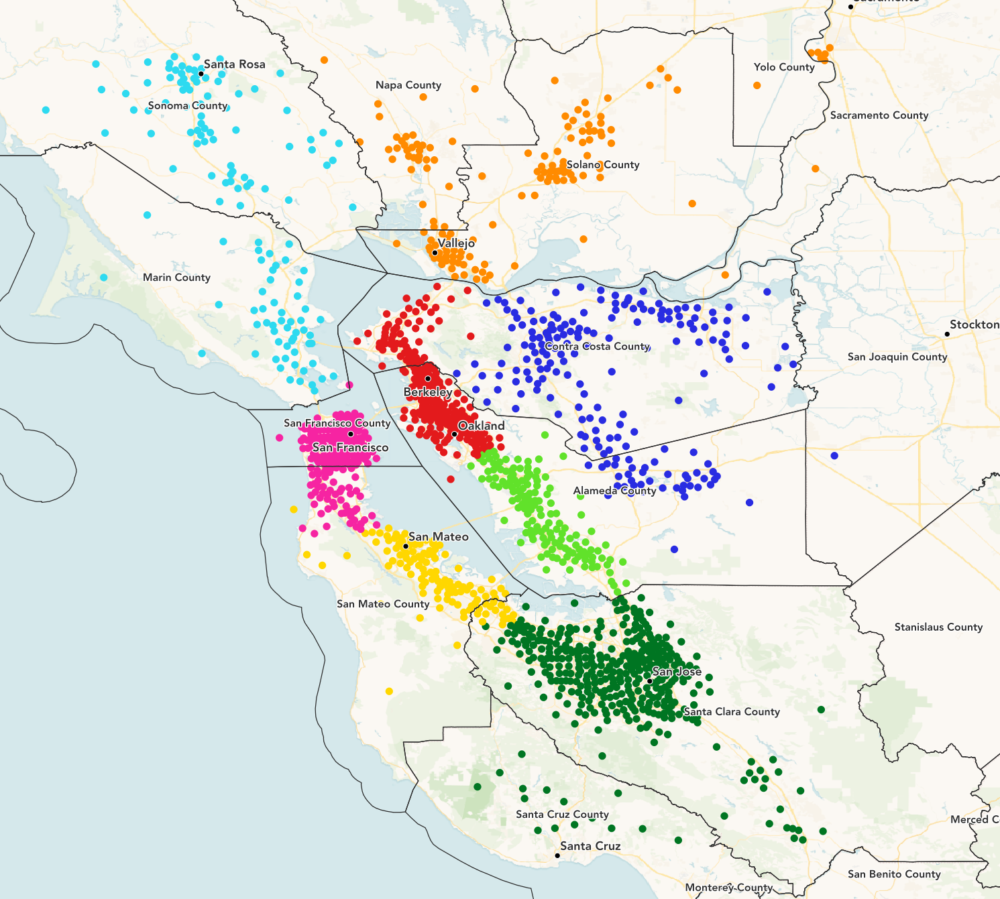

In [0]:
#@title Bay Area Clustering Results, Unacast Data, Tract Centroids
#@markdown
Image(filename=f'{data_out_path}bay_area_unacast_points.png', width=1000)

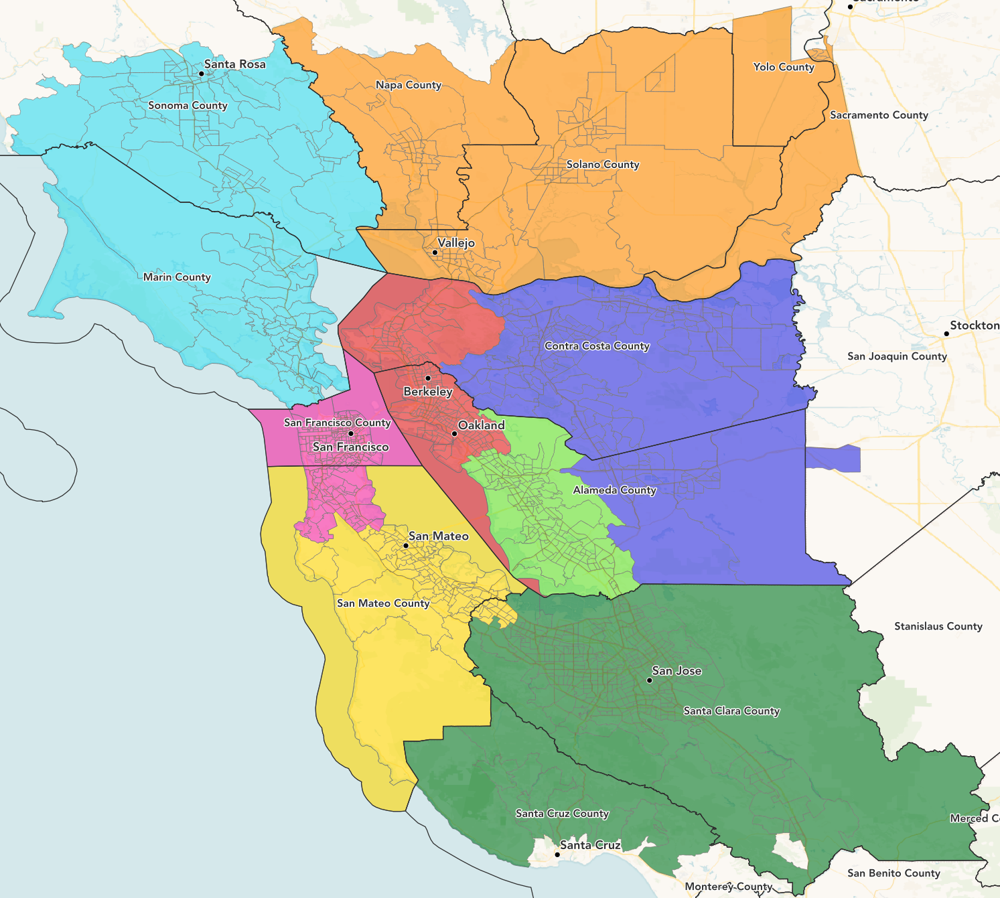

In [0]:
#@title Bay Area Clustering Results, Unacast Data, Tract Boundaries
Image(filename=f'{data_out_path}bay_area_unacast_polygons.png', width=1000)

# Question 2a: What Are The Economic Regions of Norway?

Using Telia mobility data for January through May 2019, specifically the origin–destination matrix at administrative level 3. Modularity 0.84, which is great.

Due to the complexity of the network, the optimal number of communities hovers between 27 and 31, while the modularity is pretty stable at 0.84. 

In [0]:
#@markdown **Fill in what output files from this section should be identified with**
section_id = "norway" #@param {type:"string"}

## The Nitty-Gritty

### Prep Data

In [0]:
#@markdown `Query (inert): Create table with morning transit flows in Norway for January through May of 2019, between areas at administrative level 3 (delområder)`
%%script false  # This prevents the cell from executing when it runs
%%bigquery
CREATE OR REPLACE TABLE `uc-shared-demo.z_test.norway_weekday_morning_transit_flows_201901_201906_filtered` AS

WITH staged_data AS (
  SELECT 
    origin_area_code,
    destination_area_code,
    transit_local_start_hour,
    transits_people
  FROM 
    `uc-shared-demo.mobility_insights.odm_hourly_oal3_dal3_*`
  WHERE
    -- results in 98 days out of 152
    EXTRACT(DAYOFWEEK FROM transit_local_start_hour) NOT IN (1, 7) -- Only weekdays
    AND EXTRACT(DATE FROM transit_local_start_hour) NOT IN ("2019-01-01", "2019-04-16", "2019-04-17", "2019-04-18", "2019-04-19", "2019-04-22", "2019-05-01", "2019-05-17", "2019-05-30") -- Exclude Norwegian holidays
    AND EXTRACT(DATE FROM transit_local_start_hour) NOT IN ("2019-01-22", "2019-02-12") -- These looked anomalous, high volumes
    AND EXTRACT(HOUR FROM transit_local_start_hour) >= 6
    AND EXTRACT(HOUR FROM transit_local_start_hour) <= 10
    AND origin_area_code != destination_area_code -- remove self-loops
),

norway_area_codes AS (
  SELECT
    admin_level_3_code,
    geo AS polygon,
    ST_CENTROID(geo) AS centroid,
    admin_level_1,
    admin_level_2,
    admin_level_3
  FROM
    `uc-shared-demo.maps.administrative_level_3`
),

daily_transits AS (
  SELECT
    EXTRACT(DATE FROM transit_local_start_hour) AS date,
    origin_area_code,
    destination_area_code,
    SUM(transits_people) AS transits_people_day
  FROM
    staged_data 
  GROUP BY
    date,
    origin_area_code,
    destination_area_code 
),

aggregated_transits AS (
  SELECT
    origin_area_code,
    destination_area_code, 
    SUM(transits_people_day) AS transits_people_sum,
    ROUND(AVG(transits_people_day)) AS transits_people_avg,
    APPROX_QUANTILES(transits_people_day, 1000)[OFFSET(500)] AS transits_people_median,
    ROUND(STDDEV(transits_people_day), 2) AS transits_people_stddev,
    COUNT(DISTINCT date) AS days_observed
  FROM 
    daily_transits
  GROUP BY
    origin_area_code, destination_area_code 
),

joined_aggregated AS (
  SELECT
    a.origin_area_code,
    a.destination_area_code, 
    a.transits_people_sum,
    a.transits_people_avg,
    a.transits_people_median,
    a.transits_people_stddev,
    a.days_observed,
    ST_DISTANCE(b.centroid, c.centroid) AS distance,
    b.polygon AS o_polygon,
    ST_Y(b.centroid) AS o_lat,
    ST_X(b.centroid) AS o_lon,
    c.polygon AS d_polygon,
    ST_Y(c.centroid) AS d_lat,
    ST_X(c.centroid) AS d_lon,
    b.admin_level_1 AS o_al1,
    b.admin_level_2 AS o_al2,
    b.admin_level_3 AS o_al3,
    c.admin_level_1 AS d_al1,
    c.admin_level_2 AS d_al2,
    c.admin_level_3 AS d_al3
  FROM
    aggregated_transits a
  JOIN
    norway_area_codes b ON a.origin_area_code = b.admin_level_3_code
  JOIN
    norway_area_codes c ON a.destination_area_code = c.admin_level_3_code
)

SELECT
  *
FROM
  joined_aggregated 
WHERE
  days_observed >= 90 -- observed transits on **almost** all of the days in the period
  AND distance < 100000  -- to filter out long distance transits like plane trips etc. 

In [0]:
#@markdown `Query: Create df_commutes for all of Norway`
%%capture
%%bigquery df_commutes
SELECT 
  origin_area_code AS origin,
  destination_area_code AS destination,
  transits_people_median AS flow,
  distance,
  ST_GEOGPOINT(o_lon, o_lat) AS point_origin,
  ST_GEOGPOINT(d_lon, d_lat) AS point_destination,
  ST_MAKELINE(ST_GEOGPOINT(o_lon, o_lat), ST_GEOGPOINT(d_lon, d_lat)) AS line
FROM 
  `uc-shared-demo.z_test.norway_weekday_morning_transit_flows_201901_201906_filtered`
ORDER BY
  origin,
  destination

In [0]:
#@markdown `Query: Create df_polygons for all of Norway`
%%capture
%%bigquery df_polygons
SELECT 
  admin_level_3_code,
  geo AS geom
FROM `uc-shared-demo.maps_norway.administrative_level_3`
ORDER BY
  admin_level_3_code

### Partition With Combo


Number of communities: 2, maximum possible: 2, modularity score: 0.485987
Number of communities: 3, maximum possible: 3, modularity score: 0.649387
Number of communities: 4, maximum possible: 4, modularity score: 0.718165
Number of communities: 5, maximum possible: 5, modularity score: 0.758477
Number of communities: 6, maximum possible: 6, modularity score: 0.779039
Number of communities: 7, maximum possible: 7, modularity score: 0.794099
Number of communities: 8, maximum possible: 8, modularity score: 0.80978
Number of communities: 9, maximum possible: 9, modularity score: 0.817052
Number of communities: 10, maximum possible: 10, modularity score: 0.820819
Number of communities: 11, maximum possible: 11, modularity score: 0.828715
Number of communities: 12, maximum possible: 12, modularity score: 0.83109
Number of communities: 13, maximum possible: 13, modularity score: 0.833969
Number of communities: 14, maximum possible: 14, modularity score: 0.837677
Number of communities: 15, max

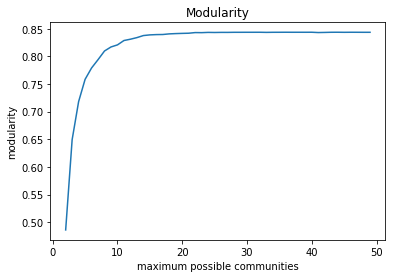

In [0]:
#@markdown **Optional:** `Inspect modularity score for increasing numbers of maximum possible communities as input to Combo`
#%%script false # Uncomment to deactivate cell

run_id = 'inspection'
to_pajek(df_commutes, run_id)
modularity_scores = []
community_counts = []
for max_communities in range(2, 50):
  modularity_score, error_message = run_combo(run_id, max_communities)
  modularity_score = modularity_score.strip()
  try:
    modularity_score = float(modularity_score) 
  except Exception:
    modularity_score = np.nan
  modularity_scores.append(modularity_score)
  community_counts.append(get_community_count(run_id))
  print(f'Number of communities: {get_community_count(run_id)}, maximum possible: {max_communities}, modularity score: {modularity_score}')
  
  if len(community_counts) > 3 and community_counts[-1] == community_counts[-2] == community_counts[-3]:
    print("Plateau reached, exiting.")
    break

remove(f'{run_id}.net')
remove(f'{run_id}_comm_comboC++.txt')


fig, ax = plt.subplots()
#modularity_scores = np.array([score if isinstance(score, float) else np.nan for score in modularity_scores])
ax.plot(list(range(2, 2 + len(modularity_scores))), modularity_scores)
ax.set(xlabel='maximum possible communities', ylabel='modularity',
       title='Modularity');

In [0]:
#@markdown `Run Combo`
to_pajek(df_commutes, section_id)
modularity_score, error_message = run_combo(section_id)
print(f'Number of communities generated: {get_community_count(section_id)}, modularity score: {float(modularity_score.strip())}')

Number of communities generated: 28, modularity score: 0.843621


In [0]:
#@markdown `Temporarily save results`

# Create area result dataframe
cols = ["area_code", "centroid"]
origins = df_commutes.loc[:, ["origin", "point_origin"]].drop_duplicates()
destinations = df_commutes.loc[:, ["destination", "point_destination"]].drop_duplicates()
origins.columns = cols
destinations.columns = cols
df_areas_assigned = pd.concat([origins, destinations], axis=0).drop_duplicates()
df_areas_assigned = df_areas_assigned.merge(df_polygons, left_on='area_code', right_on='admin_level_3_code', how='left').drop('admin_level_3_code', axis=1)
df_areas_assigned['community'] = get_community_column(df_areas_assigned, section_id, column='area_code')

# Create flow result dataframe
df_flows_assigned = df_commutes.copy()
df_flows_assigned['o_community'] = get_community_column(df_flows_assigned, section_id, column='origin')
df_flows_assigned['d_community'] = get_community_column(df_flows_assigned, section_id, column='destination')


# Save results in csv format (for visualization in QGIS)
areas_result_filename = f"{section_id}_areas_with_assigned_communities.csv"
flows_result_filename = f"{section_id}_flows_with_assigned_communities.csv"

df_areas_assigned.to_csv(areas_result_filename)
df_flows_assigned.to_csv(flows_result_filename)

In [0]:
#@markdown `Download results`
files.download(areas_result_filename)
files.download(flows_result_filename)

## Visualize Results

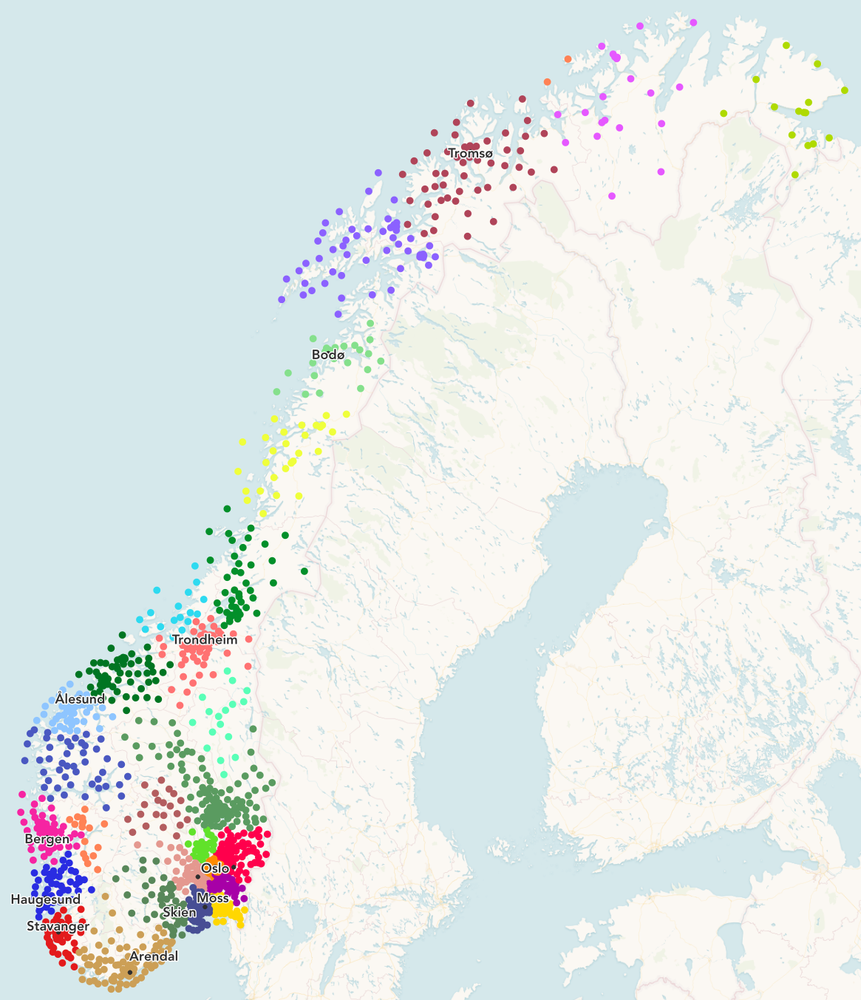

In [0]:
#@title Norway Clustering Results, Admin Level 3 Centroids
Image(filename=f'{data_out_path}norway_points.png', width=800)

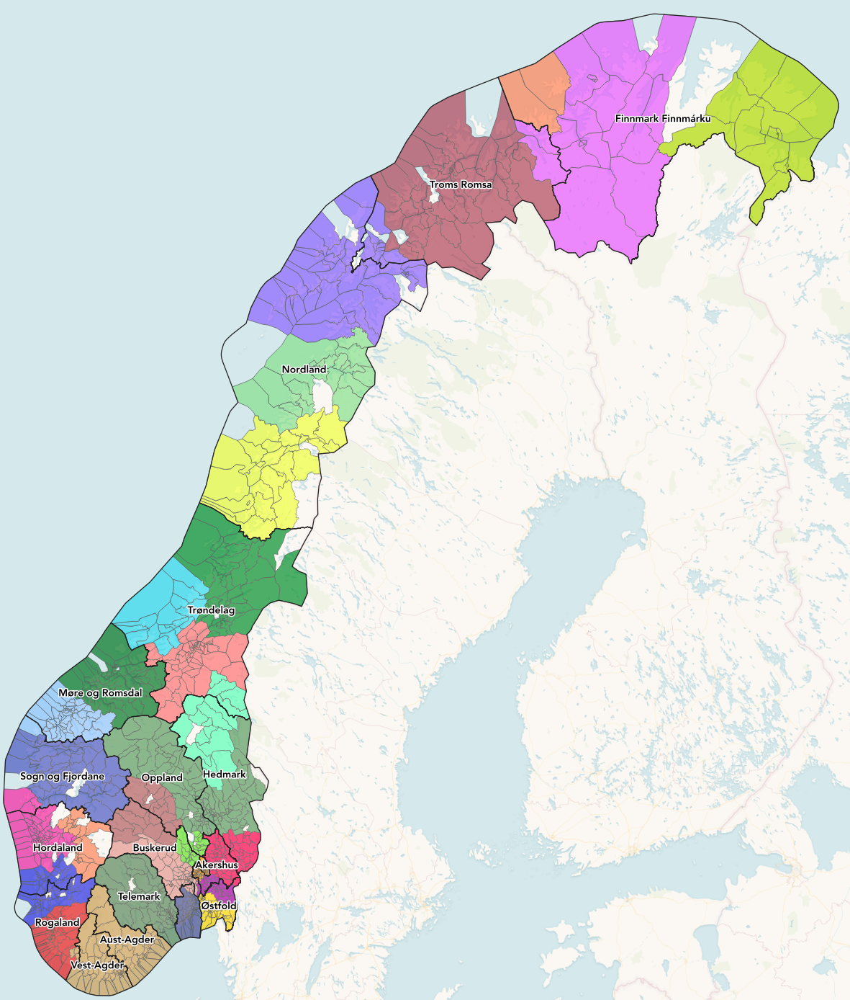

In [0]:
#@title Norway Clustering Results, Admin Level 3 Boundaries
Image(filename=f'{data_out_path}norway_polygons.png', width=800)

# Question 2b: How Does The Greater Oslo Region Commute?

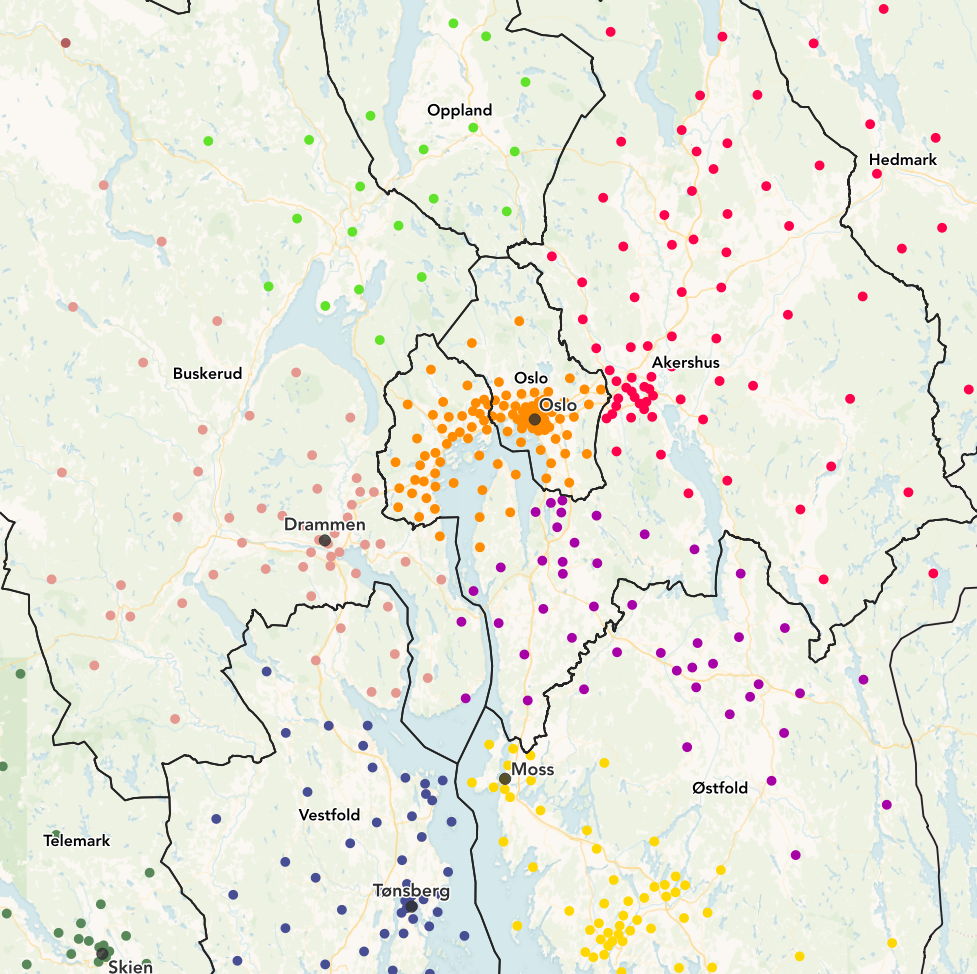

In [0]:
#@title Close-Up of Greater Oslo Region 
Image(filename=f'{data_out_path}greater_oslo_points.png', width=900)

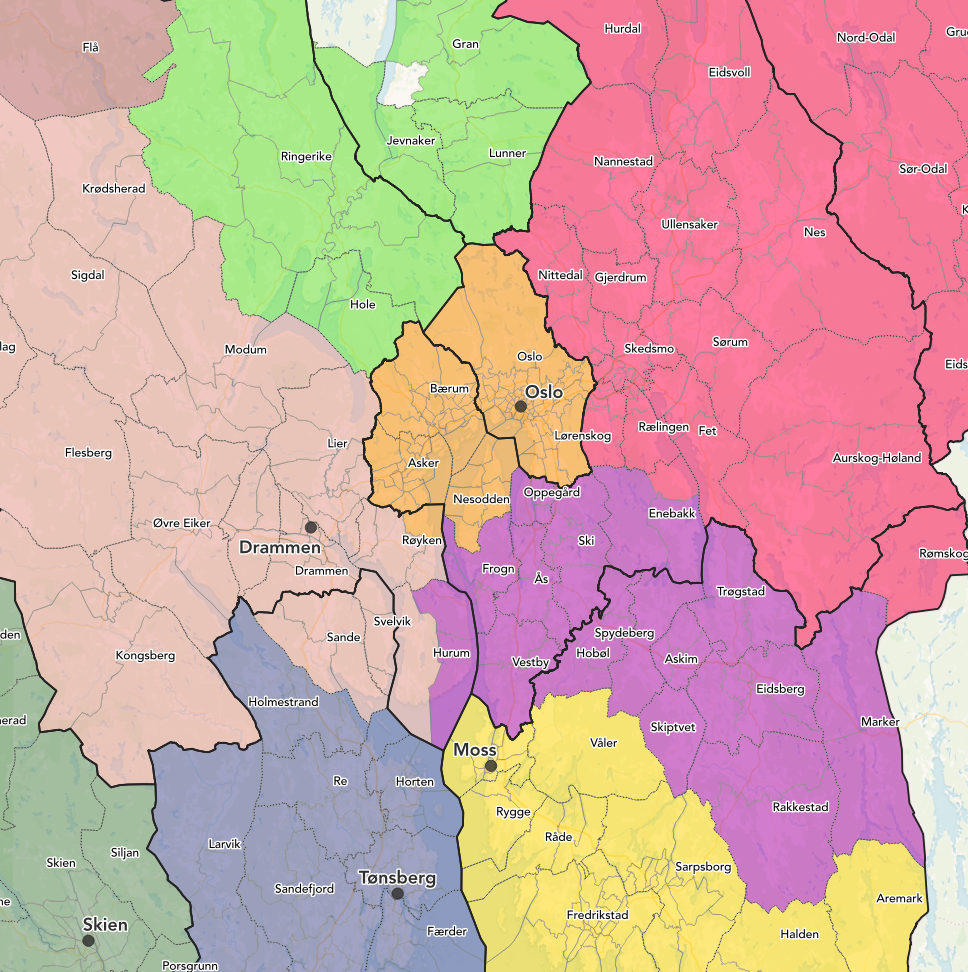

In [0]:
#@title Close-Up of Greater Oslo Region 
Image(filename=f'{data_out_path}greater_oslo_polygons.png', width=900)

# Appendix I: Data Format


## Data Cleaning
At the data selection and cleaning stage, here are some considerations:

*   Use spatial distance between origin and destination to filter out journeys or interactions that don't apply to the study.
*   If aggregating across time, consider whether an interaction is representative of a stable pattern, or if it's a one-off. E.g. with the Telia data, from the 98 possible days, if two areas did not interact on more than 90 of those days, the interaction pattern was filtered out, since I only wanted to keep those likely to represent journeys to work.  
*  Check for outliers.
*   Filter out self-loops, i.e. interactions between an area and itself.


## Input Format

Combo takes a Pajek network file as input. The `to_pajek()` function in this notebook takes a dataframe with the following columns in order, and saves the result to a `.net` Pajek file:
1. origin area code
2. destination area code
3. flow (or other numeric interaction measure, technically the weight of the edge)


## Output Format

Combo simply outputs a text file with the assigned community id of each node in the network, in the order they were provided in the Pajek file. 

# Appendix II: Further Work

If I had more time, here are some ideas to look into:
- Don't limit to just morning, weekday travels, but take *all* travels in a time period and see what comes out – a great strength of our data that's difficult to match with surveys
- Limit to weekends only, or holidays, etc.
- Use data from higher or lower levels of granularity; census blocks, counties, grunnkrets, etc.
- Explore how regions consolidate, merge, or divide over time

And some visualization ideas:
- Display flow lines 
- Display flow lines colored with destination community (as in Nelson & Rae paper)
- Display point size/alpha scaled by node in-strength (the sum of inward edge weights)
- Use two point symbols (e.g. triangles and dots) – one for net exporters and the other for net importers

